<h3>Table of Contents</h3>
<ol>
    <li>DataSet Explanation</li>
    <li>DataSet exploratory</li>
    <li>DataSet Cleaning (Grouping data, standardization of the data, dropping columns, removing nulls and duplicates)</li>
    <li>Visualization (Univariate, Bivariate, Trivariate)</li>
    <li>Preprocessing (K-fold, Regularization)</li>
    <li>Evaluation (Linear Regression, SVM, RandomForest, GridSearch)</li>
    <li>PCA</li>
</ol>


In [31]:

import pandas as pd
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt, matplotlib.dates as mdates
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.linear_model import LinearRegression, LassoCV, RidgeCV, ElasticNetCV
from sklearn import preprocessing
from sklearn.svm import SVR 
from sklearn.metrics import r2_score
from sklearn.model_selection import GridSearchCV
from sklearn.decomposition import PCA

In [32]:
df = pd.read_csv('household_power_consumption.csv',na_values=pd.NA)
df.sample(25)



C:\Users\Loay\AppData\Local\Temp\ipykernel_15424\2854678193.py:1: DtypeWarning: Columns (2,3,4,5,6,7,8) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('household_power_consumption.csv',na_values=pd.NA)


,Date,Time,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
187602,26/4/2007,00:05:00,0.210,0.102,238.520,1.000,0.000,0.000,0.0
999545,9/11/2008,20:28:00,2.338,0.218,236.180,10.000,1.000,0.000,17.0
767189,1/6/2008,11:52:00,1.396,0.138,241.480,5.800,0.000,0.000,19.0
1082487,6/1/2009,10:50:00,2.556,0.608,241.810,11.000,0.000,0.000,18.0
403286,22/9/2007,18:49:00,0.378,0.150,236.970,1.600,0.000,1.000,0.0
1163419,3/3/2009,15:42:00,1.436,0.070,241.690,5.800,0.000,0.000,18.0
151409,31/3/2007,20:52:00,4.808,0.230,235.500,20.400,0.000,31.000,17.0
438701,17/10/2007,09:04:00,1.320,0.000,237.040,5.400,1.000,0.000,17.0
878529,17/8/2008,19:32:00,0.180,0.152,240.770,0.800,0.000,0.000,1.0
610993,14/2/2008,00:36:00,0.428,0.252,242.990,2.000,0.000,2.000,0.0


<h4>- DataSet Explanation</h4>
    <p>This Dataset is Gathered to Analyze electric Power Consumption among houses, it contains multiple features:</p>
    <ol>
        <li>Date: The date of the measurement in the format dd/mm/yyyy.</li>
        <li>Time: The time of the measurement in the format hh:mm:ss.</li>
        <li>Global_active_power: household global minute-averaged active power (in kilowatt).</li>
        <li>Global_reactive_power: household global minute-averaged reactive power (in kilowatt).</li>
        <li>Voltage: minute-averaged voltage (in volt).</li>
        <li>Global_intensity: household global minute-averaged current intensity (in ampere).</li>
        <li>Sub_metering_1: energy sub-metering No. 1 (in watt-hour of active energy). It corresponds to the kitchen, containing mainly a dishwasher, an oven, and a microwave (hot plates are not electric but gas powered).</li>
        <li>Sub_metering_2: energy sub-metering No. 2 (in watt-hour of active energy). It corresponds to the laundry room, containing a washing machine, a tumble-drier, a refrigerator, and a light.</li>
        <li>Sub_metering_3: energy sub-metering No. 3 (in watt-hour of active energy). It corresponds to an electric water-heater and an air-conditioner.</li>
    </ol>


In [66]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075260 entries, 0 to 2075259
Data columns (total 9 columns):
 #   Column                 Dtype 
---  ------                 ----- 
 0   Date                   object
 1   Time                   object
 2   Global_active_power    object
 3   Global_reactive_power  object
 4   Voltage                object
 5   Global_intensity       object
 6   Sub_metering_1         object
 7   Sub_metering_2         object
 8   Sub_metering_3         object
dtypes: object(9)
memory usage: 142.5+ MB


<h4>- DataSet Explanation</h4>
<ol>
    <li>First, we need to change all of the data types to be able to process the data. So, we will change the features to float except the date and time.</li>
    <li>We will remove any duplicates/NA and change the date from object to datetime format, and remove time.</li>
    <li>Group the data by date to reduce the dataset rows without sacrificing the rows and to reduce model complexities.</li>
    <li>We will standardize the data using Mean Standardization to reduce complexities.</li>
    <li>After the previous step, the Date Feature will be standardized, so we will create a variable called AGG_ND (Aggregated data with normal date) in order to be easier noticed in plotting and visualization.</li>
</ol>


In [33]:
for i in df.columns[2:]:
    df[i] = pd.to_numeric(df[i], errors='coerce')

df.info()    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075260 entries, 0 to 2075259
Data columns (total 9 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   Date                   object 
 1   Time                   object 
 2   Global_active_power    float64
 3   Global_reactive_power  float64
 4   Voltage                float64
 5   Global_intensity       float64
 6   Sub_metering_1         float64
 7   Sub_metering_2         float64
 8   Sub_metering_3         float64
dtypes: float64(7), object(2)
memory usage: 142.5+ MB


In [34]:
df = df.dropna()
df = df.drop_duplicates()
df.drop('Time',axis=1,inplace=True)
df['Date'] = pd.to_datetime(df['Date'], format='%d/%m/%Y')

In [5]:
df.describe()

,Date,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
count,2049280,2.049280e+06,2.049280e+06,2.049280e+06,2.049280e+06,2.049280e+06,2.049280e+06,2.049280e+06
mean,2008-12-01 13:00:00.309181952,1.091615e+00,1.237145e-01,2.408399e+02,4.627759e+00,1.121923e+00,1.298520e+00,6.458447e+00
min,2006-12-16 00:00:00,7.600000e-02,0.000000e+00,2.232000e+02,2.000000e-01,0.000000e+00,0.000000e+00,0.000000e+00
25%,2007-12-10 00:00:00,3.080000e-01,4.800000e-02,2.389900e+02,1.400000e+00,0.000000e+00,0.000000e+00,0.000000e+00
50%,2008-11-30 00:00:00,6.020000e-01,1.000000e-01,2.410100e+02,2.600000e+00,0.000000e+00,0.000000e+00,1.000000e+00
75%,2009-11-23 00:00:00,1.528000e+00,1.940000e-01,2.428900e+02,6.400000e+00,0.000000e+00,1.000000e+00,1.700000e+01
max,2010-11-26 00:00:00,1.112200e+01,1.390000e+00,2.541500e+02,4.840000e+01,8.800000e+01,8.000000e+01,3.100000e+01
std,NaN,1.057294e+00,1.127220e-01,3.239987e+00,4.444396e+00,6.153031e+00,5.822026e+00,8.437154e+00


In [73]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2049280 entries, 1 to 2075259
Data columns (total 8 columns):
 #   Column                 Dtype         
---  ------                 -----         
 0   Date                   datetime64[ns]
 1   Global_active_power    float64       
 2   Global_reactive_power  float64       
 3   Voltage                float64       
 4   Global_intensity       float64       
 5   Sub_metering_1         float64       
 6   Sub_metering_2         float64       
 7   Sub_metering_3         float64       
dtypes: datetime64[ns](1), float64(7)
memory usage: 140.7 MB


In [74]:
df.sample(25)

,Date,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
1447856,2009-09-17,0.960,0.276,242.65,4.0,0.0,2.0,13.0
899813,2008-09-01,0.852,0.068,239.96,3.8,0.0,0.0,8.0
104679,2007-02-27,1.290,0.000,241.15,5.2,0.0,0.0,18.0
66836,2007-02-01,0.360,0.158,242.86,1.6,0.0,0.0,0.0
347179,2007-08-14,0.194,0.074,238.87,1.0,0.0,0.0,0.0
1530406,2009-11-13,1.590,0.312,241.21,6.6,0.0,1.0,18.0
1433886,2009-09-07,0.314,0.248,242.78,1.6,0.0,2.0,1.0
1817635,2010-05-31,0.626,0.100,243.51,2.6,0.0,0.0,0.0
620809,2008-02-20,7.694,0.236,233.87,32.8,50.0,35.0,0.0
330433,2007-08-03,0.102,0.000,235.75,0.4,0.0,0.0,0.0


In [75]:
len(df['Date'].unique())

1433

In [35]:
AGG = df.groupby('Date',as_index=False)[['Global_active_power', 'Global_reactive_power','Global_intensity','Voltage','Sub_metering_1','Sub_metering_2','Sub_metering_3']].sum()
print("Data set Has Been reduced from ",len(df), "to ", len(AGG),end="\n\n")
AGG.info()

Data set Has Been reduced from  2049280 to  1433

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1433 entries, 0 to 1432
Data columns (total 8 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   Date                   1433 non-null   datetime64[ns]
 1   Global_active_power    1433 non-null   float64       
 2   Global_reactive_power  1433 non-null   float64       
 3   Global_intensity       1433 non-null   float64       
 4   Voltage                1433 non-null   float64       
 5   Sub_metering_1         1433 non-null   float64       
 6   Sub_metering_2         1433 non-null   float64       
 7   Sub_metering_3         1433 non-null   float64       
dtypes: datetime64[ns](1), float64(7)
memory usage: 89.7 KB


In [7]:
AGG

,Date,Global_active_power,Global_reactive_power,Global_intensity,Voltage,Sub_metering_1,Sub_metering_2,Sub_metering_3
0,2006-12-16,1209.176,34.922,5180.8,93552.53,0.0,546.0,4926.0
1,2006-12-17,3390.460,226.006,14398.6,345725.32,2033.0,4187.0,13341.0
2,2006-12-18,2203.826,161.792,9247.2,347373.64,1063.0,2621.0,14018.0
3,2006-12-19,1666.194,150.942,7094.0,348479.01,839.0,7602.0,6197.0
4,2006-12-20,2225.748,160.998,9313.0,348923.61,0.0,2648.0,14063.0
...,...,...,...,...,...,...,...,...
1428,2010-11-22,2041.536,142.354,8660.4,345883.85,4855.0,2110.0,10136.0
1429,2010-11-23,1577.536,137.450,6731.2,346428.76,1871.0,458.0,7611.0
1430,2010-11-24,1796.248,132.460,7559.4,345644.59,1096.0,2848.0,12224.0
1431,2010-11-25,1431.164,116.128,6004.0,347812.21,1076.0,426.0,5072.0


In [36]:
ND = AGG["Date"]
for i in AGG.columns:
    AGG[i] = AGG[i].fillna(AGG[i].mean())
    AGG[i] = (AGG[i] -AGG[i].mean() )/(AGG[i].max()-AGG[i].min())
    print(i,len(AGG[i].unique()))
AGG_ND = AGG.copy()
AGG_ND['Date']= ND
AGG.info()

Date 1433
Global_active_power 1433
Global_reactive_power 1418
Global_intensity 1403
Voltage 1433
Sub_metering_1 874
Sub_metering_2 1033
Sub_metering_3 1355
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1433 entries, 0 to 1432
Data columns (total 8 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Date                   1433 non-null   float64
 1   Global_active_power    1433 non-null   float64
 2   Global_reactive_power  1433 non-null   float64
 3   Global_intensity       1433 non-null   float64
 4   Voltage                1433 non-null   float64
 5   Sub_metering_1         1433 non-null   float64
 6   Sub_metering_2         1433 non-null   float64
 7   Sub_metering_3         1433 non-null   float64
dtypes: float64(8)
memory usage: 89.7 KB


In [79]:
AGG_ND

,Date,Global_active_power,Global_reactive_power,Global_intensity,Voltage,Sub_metering_1,Sub_metering_2,Sub_metering_3
0,2006-12-16,-0.073942,-0.342184,-0.071359,-0.713912,-0.143534,-0.108264,-0.181527
1,2006-12-17,0.384391,0.118288,0.386323,0.003726,0.038341,0.192422,0.172894
2,2006-12-18,0.135055,-0.036454,0.130546,0.008417,-0.048436,0.063096,0.201407
3,2006-12-19,0.022087,-0.062600,0.023635,0.011562,-0.068476,0.474443,-0.127995
4,2006-12-20,0.139661,-0.038367,0.133813,0.012827,-0.143534,0.065326,0.203303
...,...,...,...,...,...,...,...,...
1428,2010-11-22,0.100954,-0.083296,0.101410,0.004177,0.290802,0.020896,0.037907
1429,2010-11-23,0.003458,-0.095113,0.005621,0.005728,0.023849,-0.115531,-0.068441
1430,2010-11-24,0.049414,-0.107138,0.046743,0.003496,-0.045484,0.081843,0.125848
1431,2010-11-25,-0.027298,-0.146495,-0.030486,0.009665,-0.047273,-0.118174,-0.175377


In [81]:
AGG

,Date,Global_active_power,Global_reactive_power,Global_intensity,Voltage,Sub_metering_1,Sub_metering_2,Sub_metering_3
0,-0.498152,-0.073942,-0.342184,-0.071359,-0.713912,-0.143534,-0.108264,-0.181527
1,-0.497458,0.384391,0.118288,0.386323,0.003726,0.038341,0.192422,0.172894
2,-0.496764,0.135055,-0.036454,0.130546,0.008417,-0.048436,0.063096,0.201407
3,-0.496070,0.022087,-0.062600,0.023635,0.011562,-0.068476,0.474443,-0.127995
4,-0.495376,0.139661,-0.038367,0.133813,0.012827,-0.143534,0.065326,0.203303
...,...,...,...,...,...,...,...,...
1428,0.499072,0.100954,-0.083296,0.101410,0.004177,0.290802,0.020896,0.037907
1429,0.499766,0.003458,-0.095113,0.005621,0.005728,0.023849,-0.115531,-0.068441
1430,0.500460,0.049414,-0.107138,0.046743,0.003496,-0.045484,0.081843,0.125848
1431,0.501154,-0.027298,-0.146495,-0.030486,0.009665,-0.047273,-0.118174,-0.175377


<h4>Visualization</h4>
<ol>
    <li>First, we will plot a normal line to describe global_active_power consumption with time.</li>
    <li>We will plot univariate using normal plotting.</li>
    <li>We will plot multivariate using pie charts (for positive values feature only).</li>
    <li>We will plot trivariate using 3D scattered plot with all different combinations.</li>
</ol>


C:\Users\Loay\AppData\Local\Temp\ipykernel_6580\3138919437.py:5: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  ax.plot_date(AGG_ND['Date'], AGG_ND["Global_active_power"], linestyle='solid', marker=None)


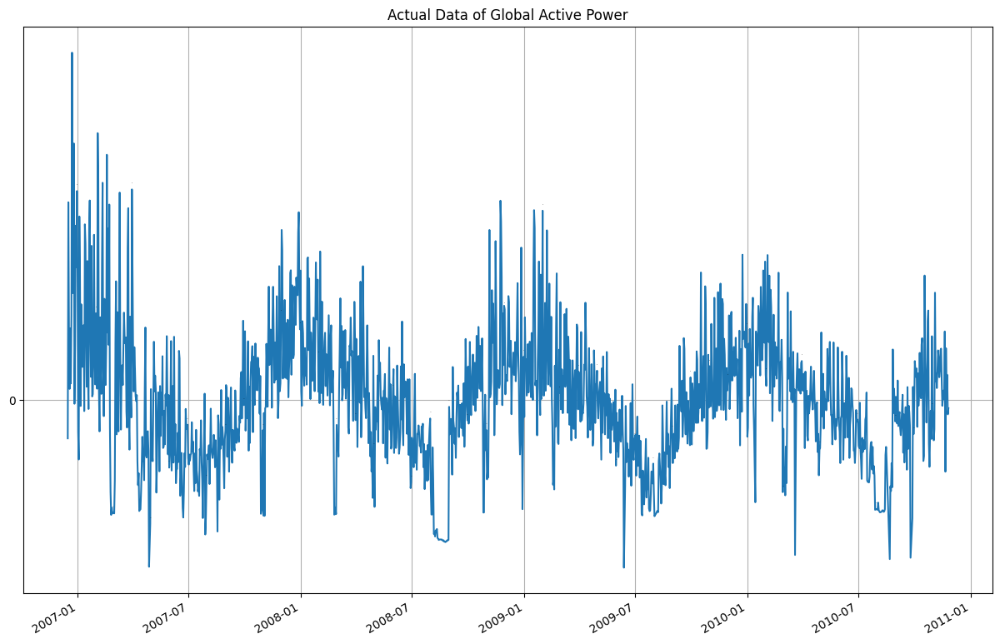

In [82]:
# Simulating the plot with your data
fig, ax = plt.subplots(figsize=(15, 10))

# Plotting the data
ax.plot_date(AGG_ND['Date'], AGG_ND["Global_active_power"], linestyle='solid', marker=None)

# Annotate each point with the value
for index, row in AGG_ND.iterrows():
    if row['Date'].is_month_end:
        ax.annotate(f'{row["Global_active_power"]:.0f}', 
                    (row['Date'], row["Global_active_power"]), 
                    xytext=(0,5), 
                    textcoords='offset points', 
                    ha='center', 
                    fontsize=0)  # Set fontsize to 0 to hide the numbers

# Set grid on
ax.grid(True)
plt.title('Actual Data of Global Active Power')

# Set y-axis ticks every 500
ax.set_yticks(range(0, int(AGG["Global_active_power"].max())+1, 500))

# Rotate and align the tick labels so they look better
fig.autofmt_xdate()

plt.show()



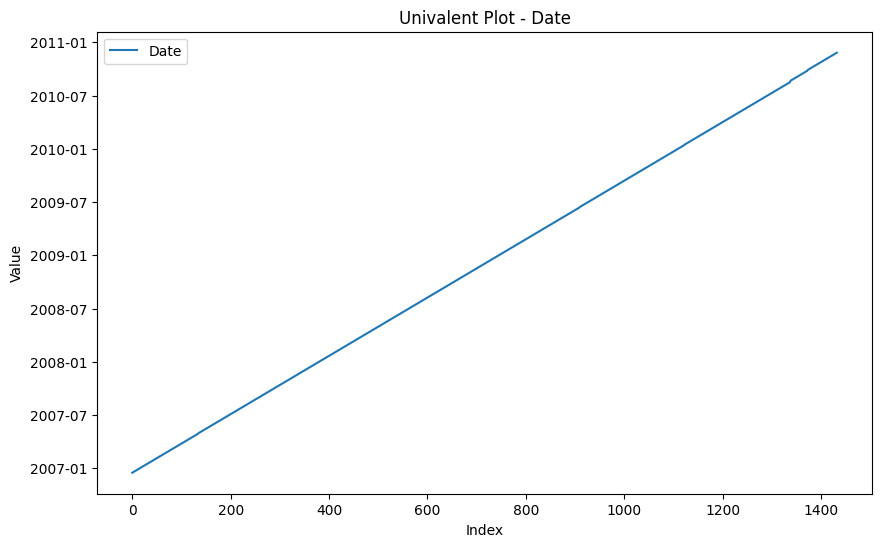

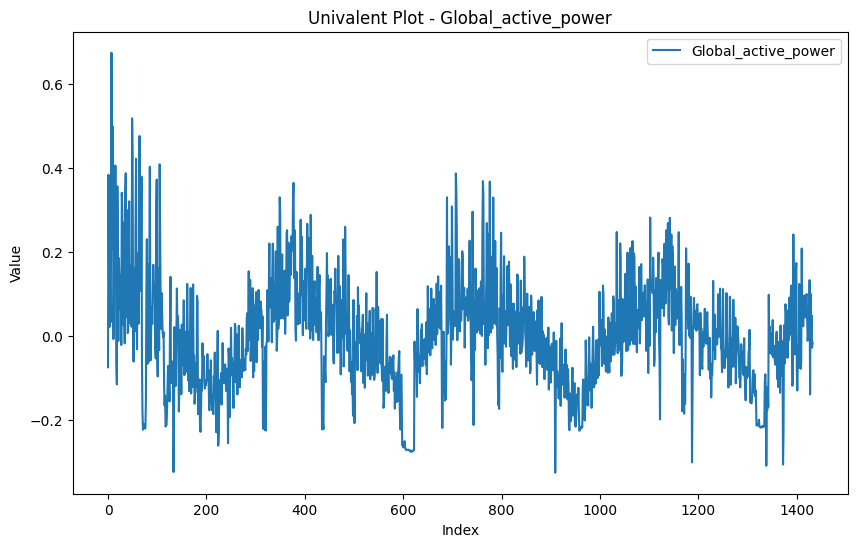

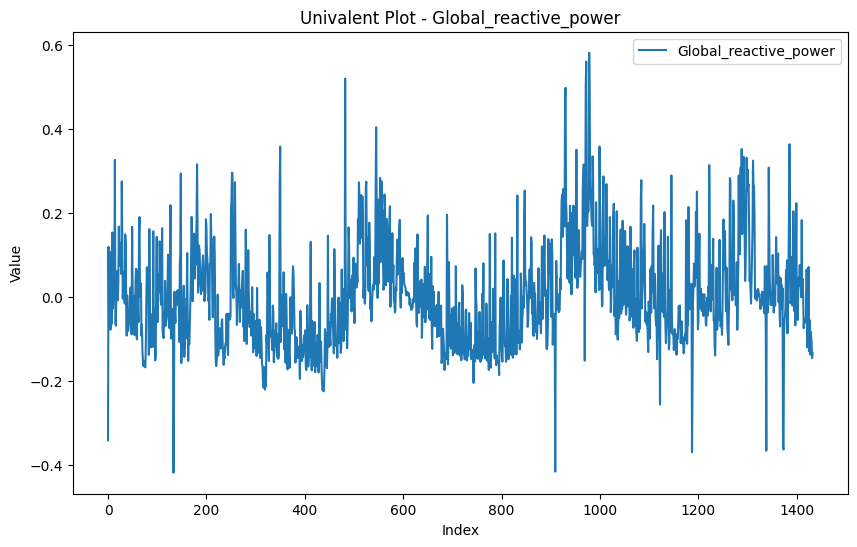

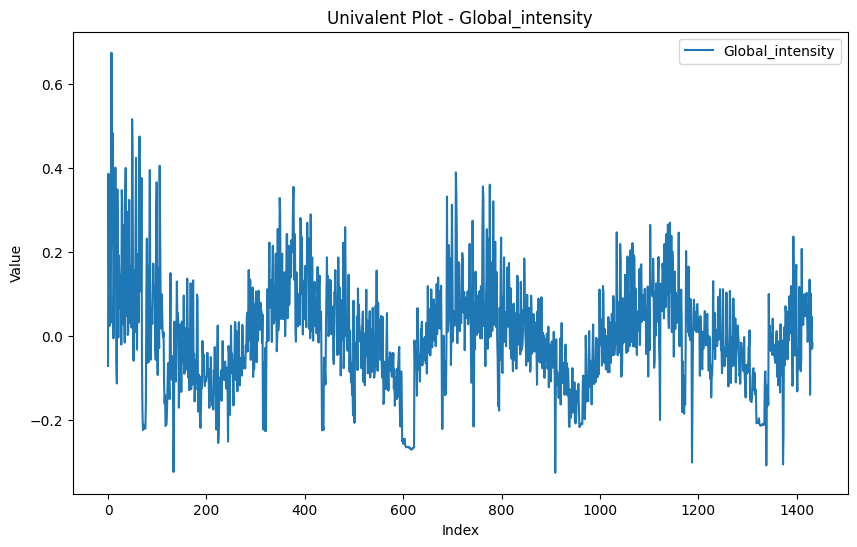

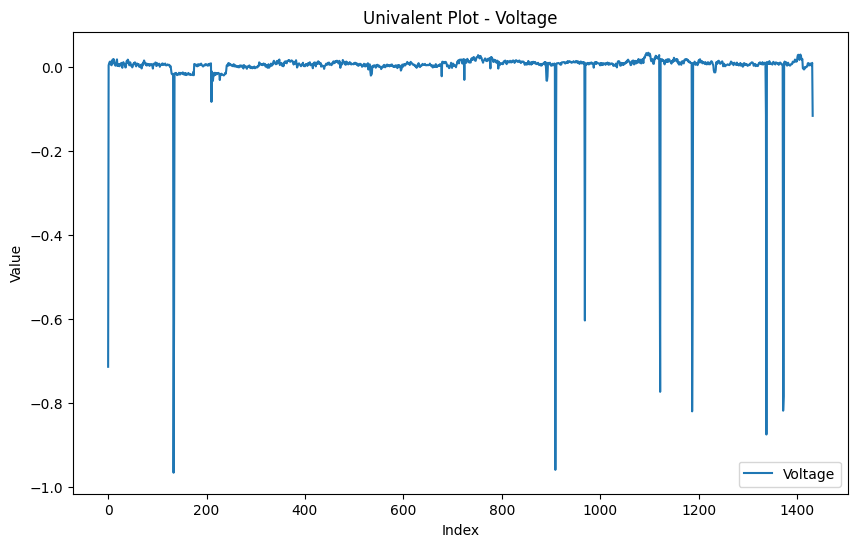

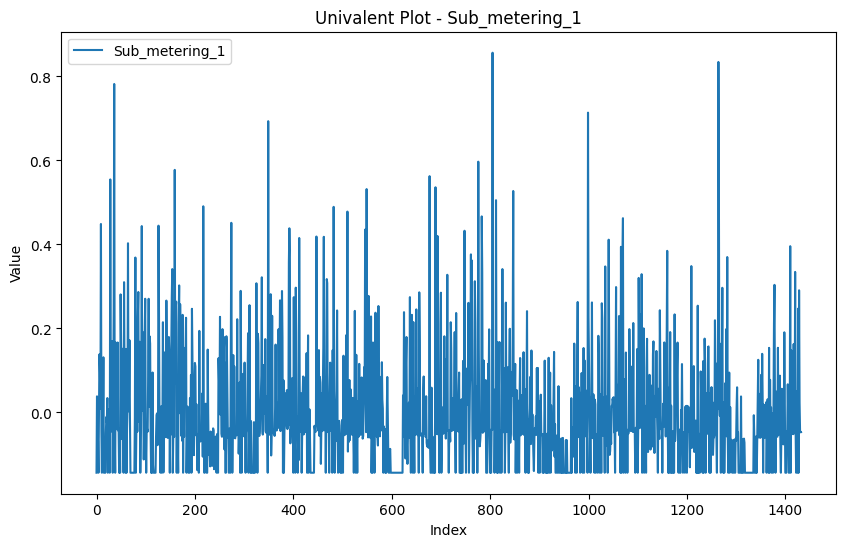

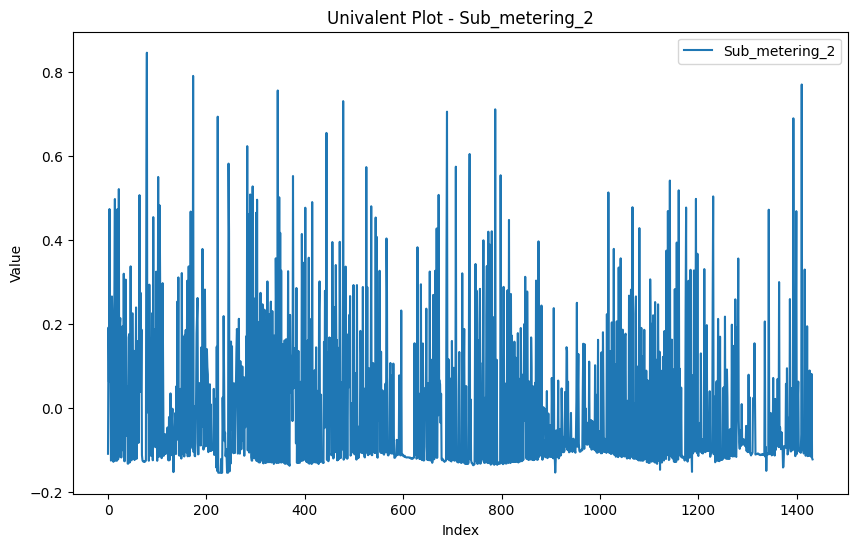

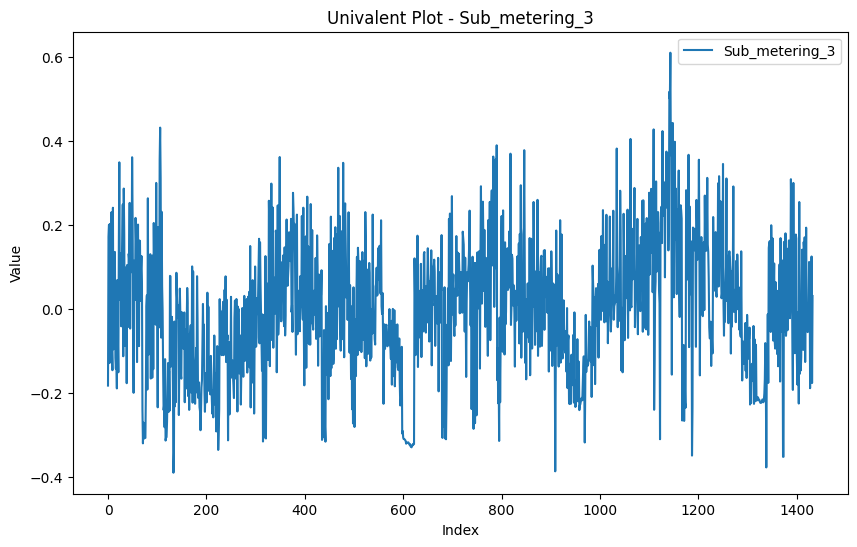

In [92]:
import matplotlib.pyplot as plt

# Iterate over each column and create a separate plot for each
for column in AGG_ND.columns:
    plt.figure(figsize=(10, 6))
    plt.plot(AGG_ND[column], label=column)
    plt.title(f'Univalent Plot - {column}')
    plt.xlabel('Index')
    plt.ylabel('Value')
    plt.legend()
    plt.show()


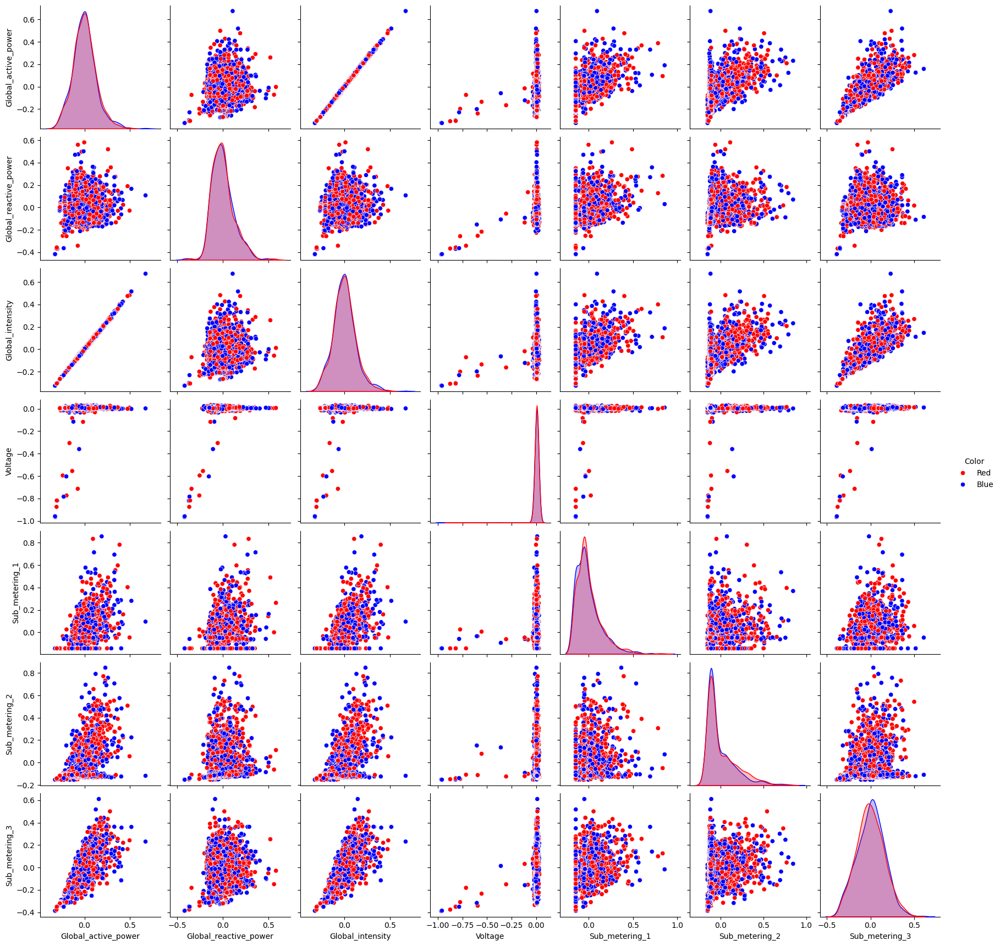

In [27]:


AGG_ND['Color'] = np.where(AGG_ND.index % 2 == 0, 'Red', 'Blue')

# Create a custom palette
custom_palette = {'Red': 'red', 'Blue': 'blue'}

# Plot with Seaborn
sb.pairplot(AGG_ND.iloc[:, 1:], hue='Color', palette=custom_palette)
plt.show()


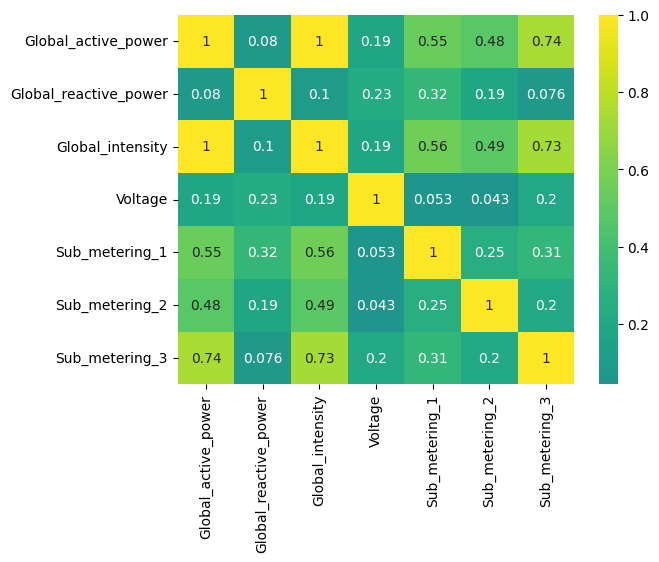

In [40]:
import seaborn as sns
import matplotlib.pyplot as plt

# Compute the correlation matrix
corr = AGG_ND.iloc[:, 1:].corr()  # Exclude the first column if it's a non-numeric column like 'Date'

# Plot the heatmap
sns.heatmap(corr, annot=True, cmap='viridis', center=0)
plt.show()


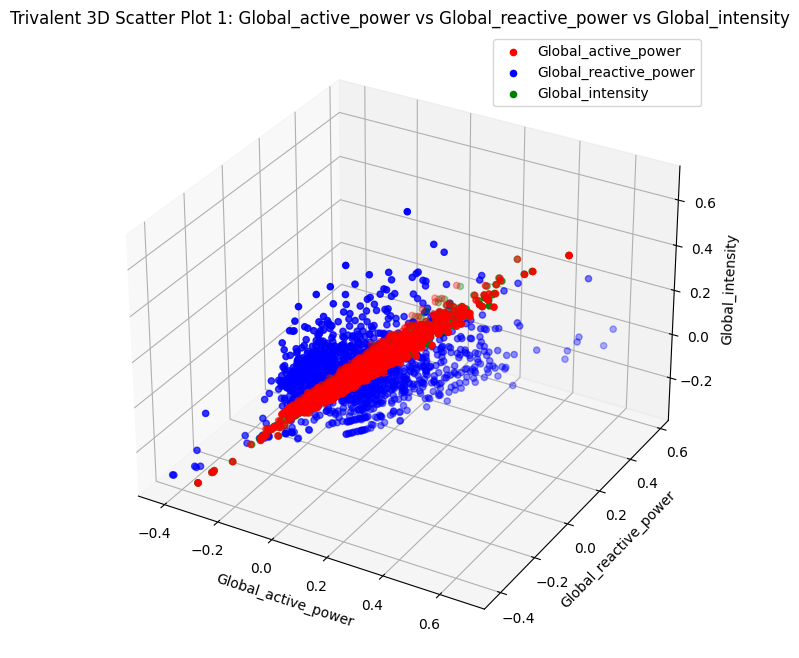

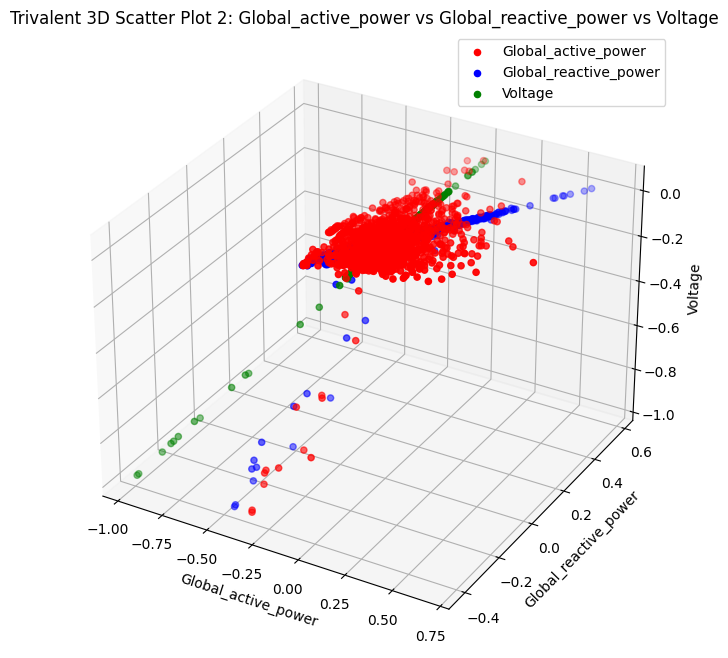

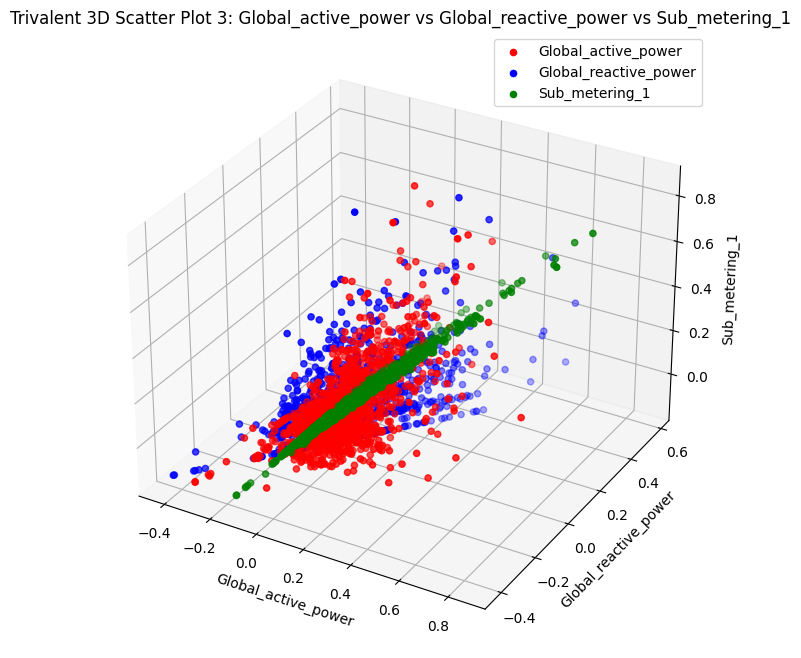

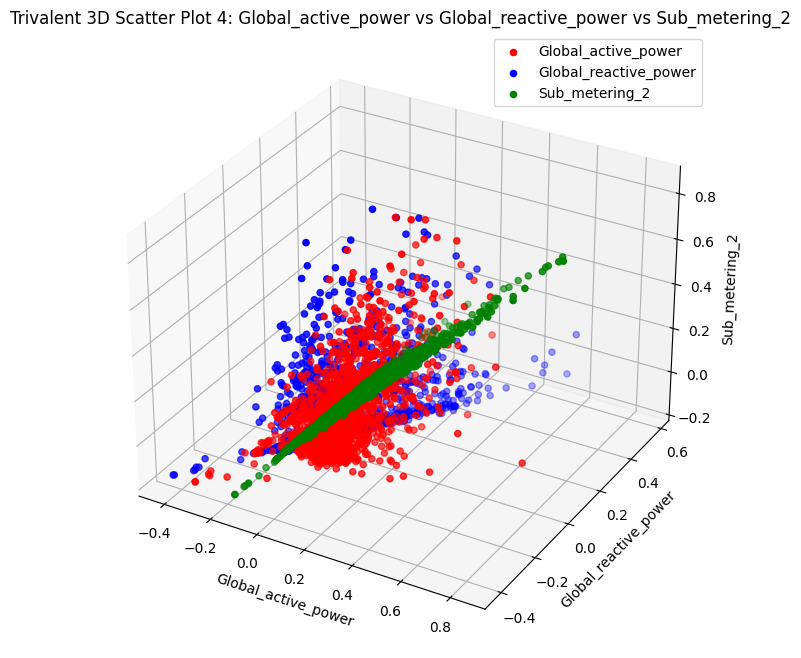

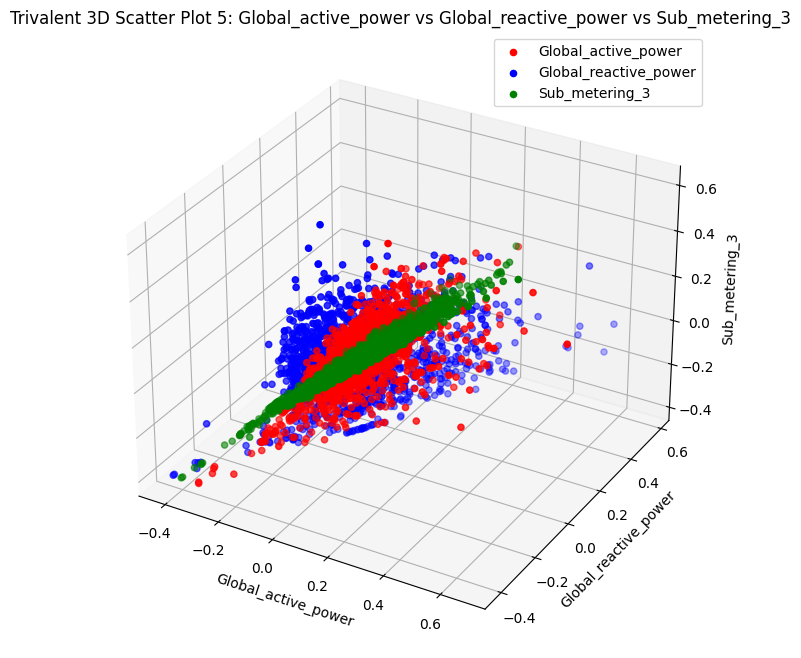

...

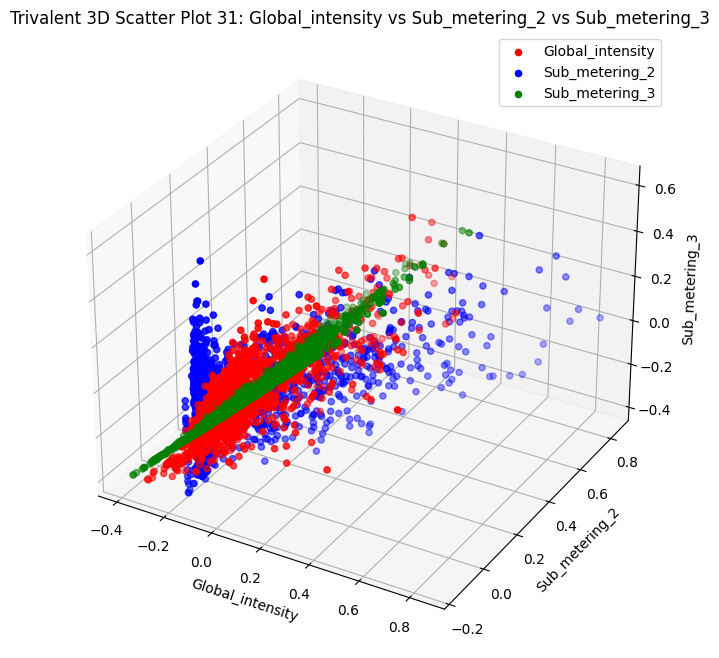

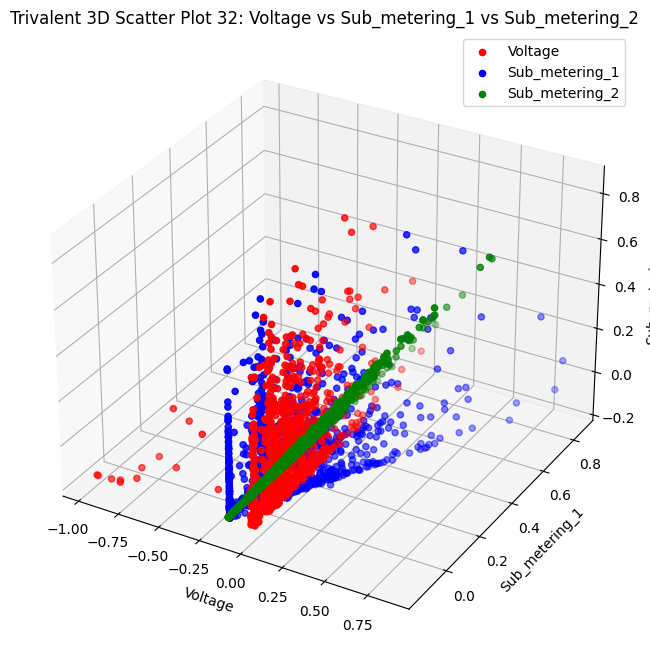

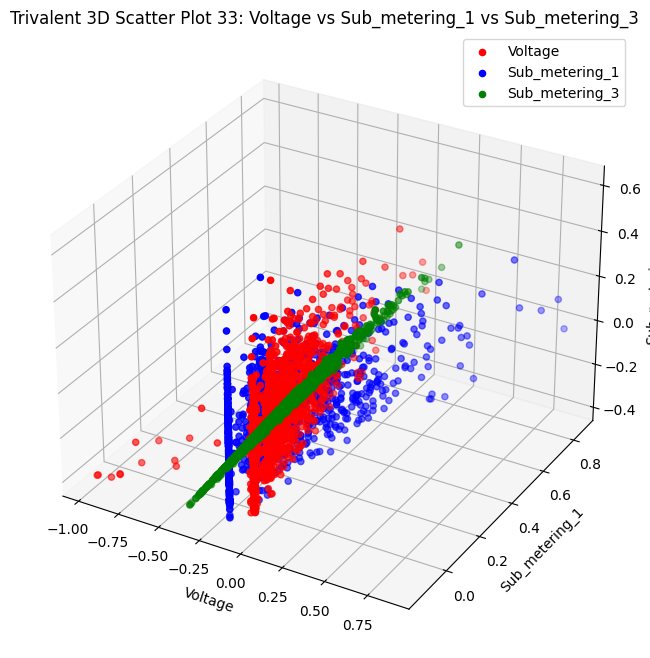

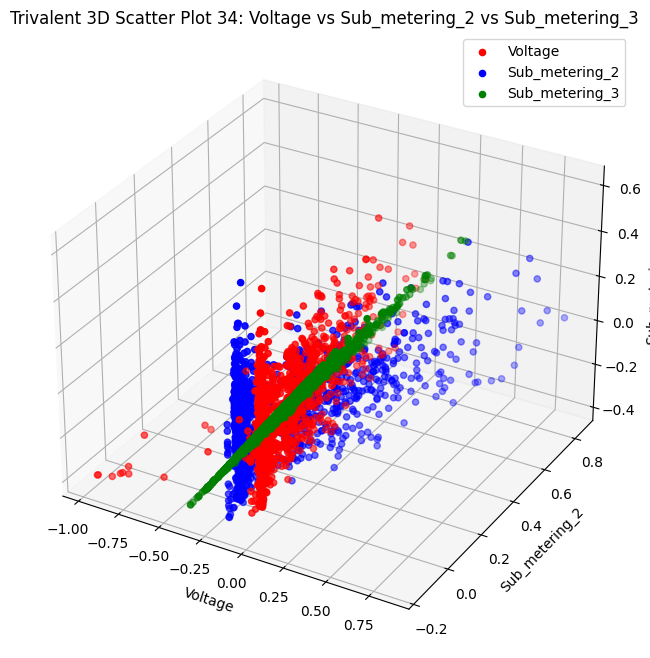

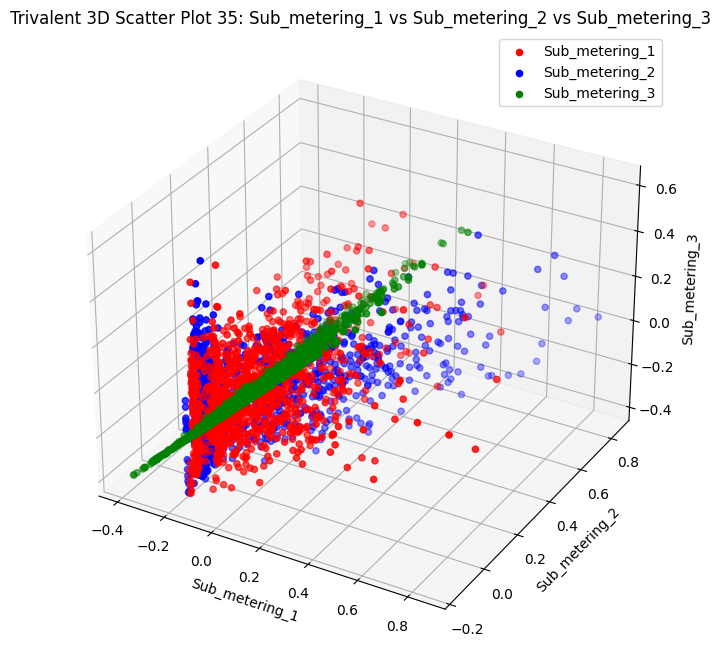

In [112]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import itertools

# Define colors for each feature
colors = ['r', 'b', 'g']

# Iterate over all combinations of three features
for i, combo in enumerate(itertools.combinations(AGG_ND.columns[1:], 3), start=1):
    feature1, feature2, feature3 = combo
    
    # Create a new figure and subplot for each combination
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Scatter plot for the current combination
    for feature, color in zip(combo, colors):
        ax.scatter(AGG_ND[feature], AGG_ND[feature2], AGG_ND[feature3], c=color, label=feature)
    
    # Set labels and title
    ax.set_xlabel(feature1)
    ax.set_ylabel(feature2)
    ax.set_zlabel(feature3)
    plt.title(f'Trivalent 3D Scatter Plot {i}: {feature1} vs {feature2} vs {feature3}')

    # Show the legend
    ax.legend()

    # Show the plot
    plt.show()


In [93]:
print(AGG.isna().sum())
AGG.sample(25)


Date                     0
Global_active_power      0
Global_reactive_power    0
Global_intensity         0
Voltage                  0
Sub_metering_1           0
Sub_metering_2           0
Sub_metering_3           0
dtype: int64


,Date,Global_active_power,Global_reactive_power,Global_intensity,Voltage,Sub_metering_1,Sub_metering_2,Sub_metering_3
1329,0.426206,-0.215587,-0.013079,-0.211447,0.007751,-0.143534,-0.110824,-0.218759
1431,0.501154,-0.027298,-0.146495,-0.030486,0.009665,-0.047273,-0.118174,-0.175377
540,-0.122719,-0.049458,0.016195,-0.039761,0.001052,0.032437,0.018832,-0.055384
72,-0.448187,-0.208565,-0.165407,-0.209987,0.008588,-0.143534,-0.126019,-0.269805
1338,0.435227,-0.308403,-0.366942,-0.308169,-0.875178,-0.143534,-0.148895,-0.376363
502,-0.149089,-0.013303,0.069037,-0.015590,0.010126,0.135049,-0.105126,-0.023122
1211,0.344318,-0.010164,-0.013927,-0.014557,0.010480,-0.045395,-0.100005,0.159921
1401,0.480335,-0.129261,-0.008804,-0.131944,0.023412,-0.143534,0.052113,-0.178873
679,-0.026258,-0.218018,-0.147936,-0.221407,0.012071,-0.143534,-0.123624,-0.304215
523,-0.134516,-0.016003,0.004912,-0.016960,0.001315,-0.143534,-0.038563,0.231564


In [94]:
AGG.describe()

,Date,Global_active_power,Global_reactive_power,Global_intensity,Voltage,Sub_metering_1,Sub_metering_2,Sub_metering_3
count,1.433000e+03,1.433000e+03,1.433000e+03,1.433000e+03,1.433000e+03,1.433000e+03,1.433000e+03,1.433000e+03
mean,7.338473e-16,3.470900e-17,3.099018e-17,1.301587e-17,1.004082e-16,-1.239607e-17,7.437642e-18,-4.958428e-18
std,2.881532e-01,1.275054e-01,1.210977e-01,1.248102e-01,7.057680e-02,1.420440e-01,1.726817e-01,1.570575e-01
min,-4.981523e-01,-3.250274e-01,-4.194467e-01,-3.256068e-01,-9.661624e-01,-1.435338e-01,-1.533541e-01,-3.889982e-01
25%,-2.490197e-01,-8.307714e-02,-8.507393e-02,-7.916438e-02,3.495995e-03,-8.797824e-02,-1.178433e-01,-1.087893e-01
50%,-5.811270e-04,-3.872118e-03,-1.449602e-02,-4.408420e-03,7.214655e-03,-4.396321e-02,-9.703238e-02,1.558971e-03
75%,2.485514e-01,6.987144e-02,6.176900e-02,6.685204e-02,1.091701e-02,5.346030e-02,7.226318e-02,1.044525e-01
max,5.018477e-01,6.749726e-01,5.805533e-01,6.743932e-01,3.383760e-02,8.564662e-01,8.466459e-01,6.110018e-01


<h4>Preprocessing</h4>
<ol>
    <li>Splitting the data twice, one for the last visualization (Normal Date) and second for Model Trainings.</li>
    <li>Applying K-fold cross-validation to ensure we don't have fitting data problems (underfitting or overfitting) {which we don't have in our data}.</li>
    <li>Regularizations using Lasso and Elastic Net to determine if there are any unuseful features {which there aren't}.</li>
</ol>


In [95]:
AGG
xplt = AGG_ND.drop('Global_active_power', axis=1)
yplt = AGG_ND['Global_active_power']
x_trainplt, x_testplt, y_trainplt, y_testplt = train_test_split(xplt, yplt, test_size=0.2, random_state=42)


x = AGG.drop('Global_active_power', axis=1)
y = AGG['Global_active_power']
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)



In [96]:
model = LinearRegression()
# Perform K-Fold CV to evaluate model using R-squared
kf = KFold(n_splits=5, shuffle=True, random_state=42)
scores = cross_val_score(model, x_train, y_train, cv=kf, scoring='r2')
print(f'Cross-Validation R-squared Scores: {scores}')
print(f'Mean CV R-squared: {scores.mean()}')

model.fit(x_train,y_train)
# Predicting on the test set
y_pred = model.predict(x_test)

# Calculating R-squared score on the test set
score = r2_score(y_test, y_pred)
print("R-squared score on test set:", score)

Cross-Validation R-squared Scores: [0.99901775 0.99945915 0.99912776 0.99906233 0.99920028]
Mean CV R-squared: 0.9991734570332824
R-squared score on test set: 0.9992827224263466


In [97]:
df.sample(5)

,Date,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
1533977,2009-11-15,0.890,0.162,243.57,3.6,0.0,0.0,12.0
721721,2008-04-30,0.326,0.096,239.10,1.4,0.0,2.0,0.0
131814,2007-03-18,1.804,0.204,243.14,7.4,0.0,0.0,18.0
1073392,2008-12-31,0.314,0.084,247.43,1.2,0.0,0.0,0.0
1728227,2010-03-30,2.808,0.000,240.09,11.6,0.0,0.0,18.0


In [98]:
def  my_regularization(regg):
    print("Using ",str(regg)[:-2])
    regg.fit(x_train,y_train)
    print("alpha",regg.alpha_)
    print("score",regg.score(x_train,y_train))
    coef= regg.coef_
    coef = pd.Series(coef,index=x_train.columns)
    print(coef)

my_regularization(LassoCV())
print('\n')
my_regularization(ElasticNetCV())


Using  LassoCV
alpha 1.5709648956340402e-05
score 0.9991985971391338
Date                     0.005240
Global_reactive_power   -0.022969
Global_intensity         1.019757
Voltage                  0.002063
Sub_metering_1          -0.004093
Sub_metering_2          -0.001979
Sub_metering_3           0.007731
dtype: float64


Using  ElasticNetCV
alpha 3.1419297912680804e-05
score 0.9991874856850321
Date                     0.004972
Global_reactive_power   -0.023359
Global_intensity         1.015478
Voltage                  0.002488
Sub_metering_1          -0.002918
Sub_metering_2          -0.001108
Sub_metering_3           0.009754
dtype: float64


<h4>Model Evaluations</h4>
<ol>
    <li>Choosing between two models (SVR: Support Vector Regressor, Linear Regression).</li>
    <li>Applying GridSearch to the better Model and visualizations (output comparison).</li>
    <li>Trying also Grid Search with Random Forest to see what is the best out of those three.</li>
</ol>


In [99]:
svr =SVR(kernel='linear')
svr.fit(x,y)
y_pred = svr.predict(x_test)
score = r2_score(y_test, y_pred)
print("R-squared score:", score)

R-squared score: 0.8941056223347388


In [100]:

model = LinearRegression()
model.fit(x_train, y_train)

# Predicting on the test set
y_pred = model.predict(x_test)

# Calculating R-squared score
score = r2_score(y_test, y_pred)
print("R-squared score:", score)


R-squared score: 0.9992827224263466


C:\Users\Loay\AppData\Local\Temp\ipykernel_6580\389746246.py:4: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plt.plot_date(x_testplt['Date'] ,y_test.round(2), linestyle='solid', marker=None, label='Actual')
C:\Users\Loay\AppData\Local\Temp\ipykernel_6580\389746246.py:6: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plt.plot_date(x_testplt['Date'], y_pred.round(2), linestyle='solid', marker=None, label='Predicted')


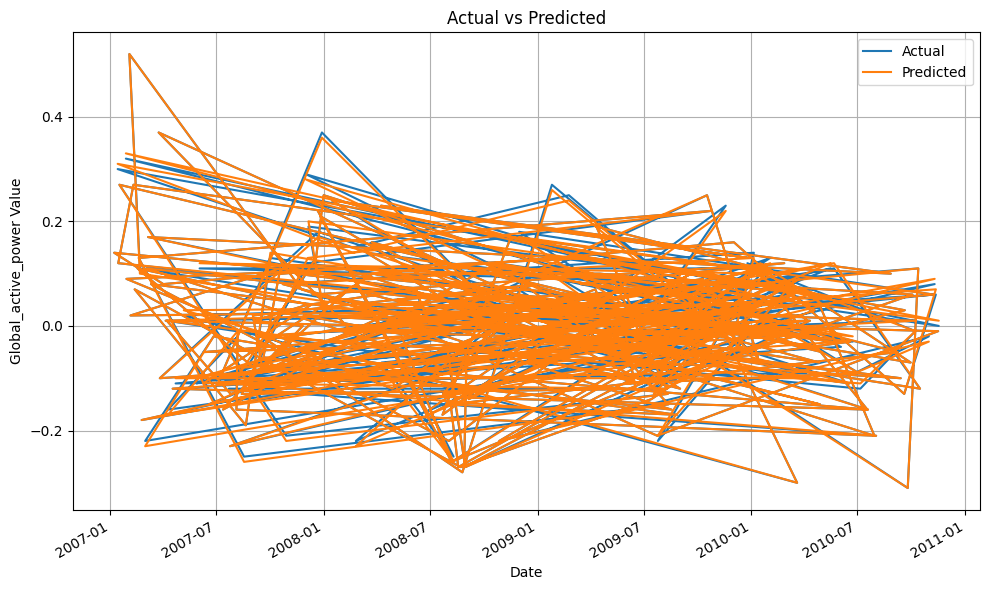

In [101]:

# Plotting the actual vs predicted values
plt.figure(figsize=(10, 6))
# Plot actual values
plt.plot_date(x_testplt['Date'] ,y_test.round(2), linestyle='solid', marker=None, label='Actual')
# Plot predicted values
plt.plot_date(x_testplt['Date'], y_pred.round(2), linestyle='solid', marker=None, label='Predicted')
# Adding the legend
plt.legend()
# Adding a grid
plt.grid(True)
# Rotate and align the tick labels so they look better
plt.gcf().autofmt_xdate()
# Set title and labels
plt.title('Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Global_active_power Value')
# Show plot with tight layout
plt.tight_layout()
plt.show()


In [102]:
param = {"fit_intercept":[0,1],"n_jobs":[0,1,2,-1],"positive":[0,1]}
grid = GridSearchCV(LinearRegression(), param, cv=5, return_train_score=False)
grid.fit(x_train, y_train)
best = grid.best_params_
usedsearch ="GridSearchCV"
grid.cv_results_

c:\Program Files\Python311\Lib\site-packages\sklearn\utils\_param_validation.py:594: FutureWarning: Passing an int for a boolean parameter is deprecated in version 1.2 and won't be supported anymore in version 1.4.
  warnings.warn(
c:\Program Files\Python311\Lib\site-packages\sklearn\utils\_param_validation.py:594: FutureWarning: Passing an int for a boolean parameter is deprecated in version 1.2 and won't be supported anymore in version 1.4.
  warnings.warn(
c:\Program Files\Python311\Lib\site-packages\sklearn\utils\_param_validation.py:594: FutureWarning: Passing an int for a boolean parameter is deprecated in version 1.2 and won't be supported anymore in version 1.4.
  warnings.warn(
c:\Program Files\Python311\Lib\site-packages\sklearn\utils\_param_validation.py:594: FutureWarning: Passing an int for a boolean parameter is deprecated in version 1.2 and won't be supported anymore in version 1.4.
  warnings.warn(
c:\Program Files\Python311\Lib\site-packages\sklearn\utils\_param_valida

{'mean_fit_time': array([0.00180159, 0.00160155, 0.00140119, 0.00120134, 0.00140085,
        0.00120087, 0.00120087, 0.00140157, 0.0012013 , 0.00140123,
        0.0016016 , 0.00140119, 0.00140119, 0.00120111, 0.00140147,
        0.00120096]),
 'std_fit_time': array([0.00040035, 0.00048957, 0.00049027, 0.00040009, 0.00049054,
        0.00039997, 0.00039997, 0.00049025, 0.00039988, 0.00049052,
        0.00049029, 0.00049056, 0.00049008, 0.00040009, 0.00049023,
        0.00040016]),
 'mean_score_time': array([0.00080075, 0.00100069, 0.00060077, 0.00100079, 0.00080099,
        0.00100098, 0.00080075, 0.00080042, 0.00080066, 0.00080085,
        0.00100074, 0.00100107, 0.00100088, 0.00080066, 0.00100079,
        0.00100098]),
 'std_score_time': array([4.00376529e-04, 4.62310777e-07, 4.90524366e-04, 1.90734863e-07,
        4.00495685e-04, 3.23406696e-07, 4.00376387e-04, 4.00209441e-04,
        4.00329215e-04, 4.00424270e-04, 2.43140197e-07, 4.86280395e-07,
        6.21719590e-07, 4.00328846e-

In [103]:
print(best)
fit_intercept = best['fit_intercept']
n_jobs = best['n_jobs']
positive = best["positive"]


{'fit_intercept': 0, 'n_jobs': 0, 'positive': 0}


In [115]:

param =  {
    'criterion': ["squared_error", "friedman_mse", "poisson"],
    'max_depth': [None, 10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ["auto", "sqrt", "log2"]
}

grid = GridSearchCV(RandomForestRegressor(), param, cv=5, return_train_score=False)
grid.fit(x_train, y_train)
bestf = grid.best_params_
usedsearch ="GridSearchCV"
grid.cv_results_

c:\Program Files\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:425: FitFailedWarning: 
1350 fits failed out of a total of 2430.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
810 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Program Files\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Program Files\Python311\Lib\site-packages\sklearn\base.py", line 1145, in wrapper
    estimator._validate_params()
  File "c:\Program Files\Python311\Lib\site-packages\sklearn\base.py", line 638, in _validate_params
    validate_parameter_constraints(
  File "c:\Program Files\Python311\Lib

{'mean_fit_time': array([0.00400391, 0.00120091, 0.00140109, 0.00140119, 0.00120096,
        0.00140142, 0.00140133, 0.00140162, 0.00120111, 0.56311331,
        0.46502342, 0.41097488, 0.44340372, 0.43399568, 0.40596991,
        0.39556031, 0.39475961, 0.38234801, 0.56571465, 0.47062793,
        0.41457663, 0.45361261, 0.44820828, 0.41838107, 0.3895546 ,
        0.40016427, 0.38394966, 0.00120153, 0.00120106, 0.0010005 ,
        0.00120082, 0.00120106, 0.00120125, 0.00099773, 0.0010006 ,
        0.00100069, 0.46502309, 0.42798777, 0.40076509, 0.42578783,
        0.41637921, 0.40456858, 0.38374963, 0.38555093, 0.37614284,
        0.46462331, 0.43339496, 0.40737071, 0.42839012, 0.42578821,
        0.41898146, 0.40256672, 0.38635101, 0.37854462, 0.00120111,
        0.00100102, 0.00100079, 0.00140152, 0.00120096, 0.00100107,
        0.00100074, 0.00140123, 0.00100107, 0.55350428, 0.46282129,
        0.41057415, 0.44500532, 0.43299413, 0.40016418, 0.3843502 ,
        0.38455048, 0.3773438 ,

In [116]:
print(bestf)
model = RandomForestRegressor(criterion=bestf['criterion'],max_depth=bestf['max_depth'],max_features=bestf['max_features'],min_samples_leaf=bestf['min_samples_leaf'],min_samples_split=bestf['min_samples_split'])
model.fit(x_train,y_train)
y_pred = model.predict(x_test)
print(r2_score(y_test,y_pred))

{'criterion': 'friedman_mse', 'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2}
0.9864108773926549


<h4>PCA<h4>

<p>Applying PCA and see if it give us the same accuracy {which is not}</p>

In [117]:
pca = PCA(n_components=3)
X_pca = pca.fit_transform(x)
X_train_pca, X_test_pca, y_train, y_test = train_test_split(X_pca, y, test_size=0.2, random_state=42)
model = LinearRegression()
model.fit(X_train_pca, y_train)
y_pred = model.predict(X_test_pca)
print(r2_score(y_test,y_pred))


0.8905346049889629
